# Diplomado en Ciencia de Datos
## Módulo 6: Aprendizaje de máquina supervisado
### Proyecto Final

    Ángel Andrés Moreno Sánchez

### Abstract
Credit card fraud is a finantial bussines problem that causes tens of billions of dollars on finantial losses worldwide. Scenarios where fraudster can succed change over time and adapt to the current fixed solutions, therefore a constant research and technology investment to prevent this problem is needed as at least a tenth of american has suffered credict card fraud for at least a mean of \$399. In this work I present a cross-validated machine learning _______ prediction model whose accuracy is ______. The model was trained using Kaggle's Credict Card Fraud Detection public dataset which ontains transactions made by credit cards in September 2013 by European cardholders. The application of this model on a real world scenario could translate to a reduction of _____ $$$ of finactial losses caused by fraud. 

## 1. Introduction


## 2. Exploratory Data Analysis 

In [1]:
# Import required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cufflinks as cf
import chart_studio.plotly as py
import plotly.express as px
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot 
init_notebook_mode(connected = True)
cf.go_offline()
import seaborn as sns

In [2]:
# Import the dataset

df = pd.read_csv('creditcard.csv')
df.head(5)

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


The dataset contains 31 columns, which 30 belong to the feature vector and the last one indicates if the transaction was a fraud. V1-V28 are anonymmous features extracted by PCA, they remain nameless due to confidentiality of the cardholders. 

### 2.1. See target variable distribution

In [3]:
fig = px.histogram(df, x='Class',histnorm='percent')
fig.show()

We are dealing with a highly inbalanced dataset so SMOTE techniques will have to be used. The unbalanced was expected due to the nature of the problem.

### 2.2. Getting insights  of the dataset

#### 2.2.1 The amount variable

In [4]:
df.shape

(284807, 31)

As we can see the amount of observations is high so we'll get a sample of the data for the visualization

In [5]:
legit_df = [x for x in df.groupby('Class')][0][1].sample(n=2000,random_state=42)
fraud_df = [x for x in df.groupby('Class')][1][1]

Text(0.5, 1.0, 'Fraud transactions')

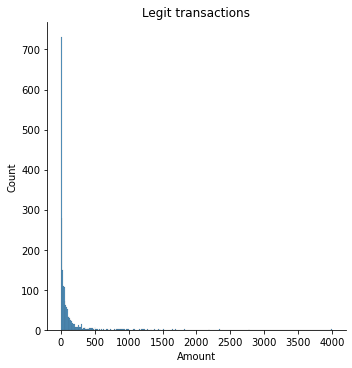

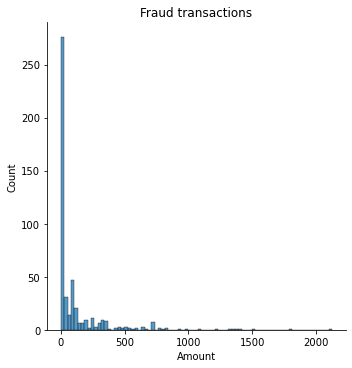

In [6]:
sns.displot(legit_df, x="Amount")
plt.title('Legit transactions')
sns.displot(fraud_df, x="Amount")
plt.title('Fraud transactions')

Now in log scale, ommiting 0 values

In [7]:
legit_df_f = legit_df[0<legit_df['Amount']]
fraud_df_f = fraud_df[0<fraud_df['Amount']]

Text(0.5, 1.0, 'Fraud transactions')

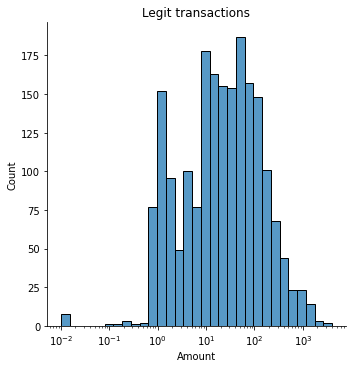

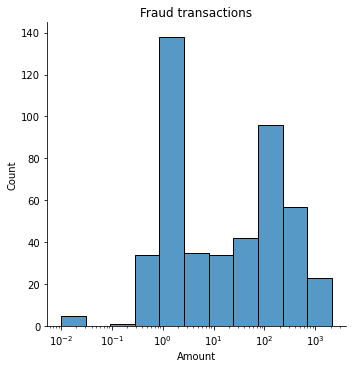

In [8]:
sns.displot(legit_df_f, x="Amount",log_scale=True)
plt.title('Legit transactions')
sns.displot(fraud_df_f, x="Amount",log_scale=True)
plt.title('Fraud transactions')

We see that there are very few transactions for high amounts of money, lets check the distribution for transaction lower than and greater than the mean value

In [9]:
mean_val = df['Amount'].mean()

In [10]:
legit_df_l = legit_df[mean_val>legit_df['Amount']]
fraud_df_l = fraud_df[mean_val>fraud_df['Amount']]
legit_df_g = legit_df[mean_val<legit_df['Amount']]
fraud_df_g = fraud_df[mean_val<fraud_df['Amount']]

Text(0.5, 1.0, 'Fraud transactions')

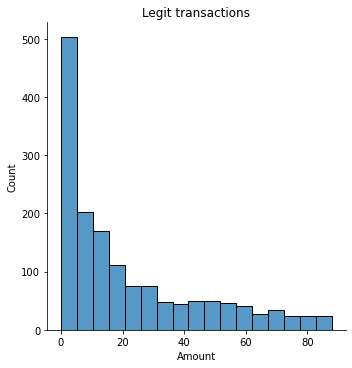

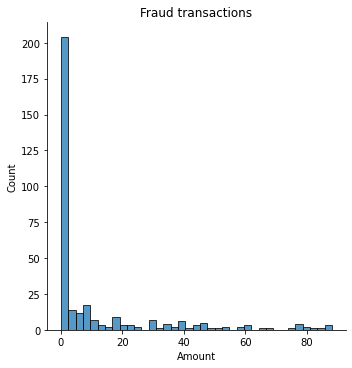

In [11]:
sns.displot(legit_df_l, x="Amount")
plt.title('Legit transactions')
sns.displot(fraud_df_l, x="Amount")
plt.title('Fraud transactions')

Text(0.5, 1.0, 'Fraud transactions')

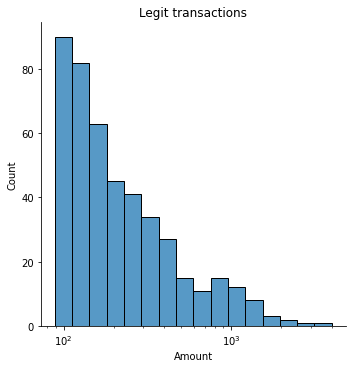

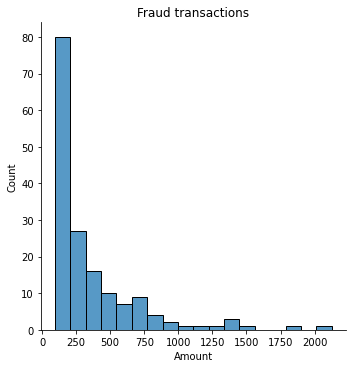

In [12]:
sns.displot(legit_df_g, x="Amount",log_scale=True)
plt.title('Legit transactions')
sns.displot(fraud_df_g, x="Amount")
plt.title('Fraud transactions')

Using the plots above we can see that either the fraud or the legit transaction has a bivariate distribution having a lot of transactions for 0  EUR and a lot of transactions around $10^2$ EUR.

#### 2.2.2. Visualizing the feature vector

In [13]:
df.columns

Index(['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount',
       'Class'],
      dtype='object')

In [14]:
features_1 = ['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10']
features_2 = ['V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20']
features_3 = ['V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28']
legit_f1 = legit_df[features_1] 
legit_f2 = legit_df[features_2]
legit_f3 = legit_df[features_3]

fraud_f1 = fraud_df[features_1]
fraud_f2 = fraud_df[features_2]
fraud_f3 = fraud_df[features_3]

**Legit transactions**

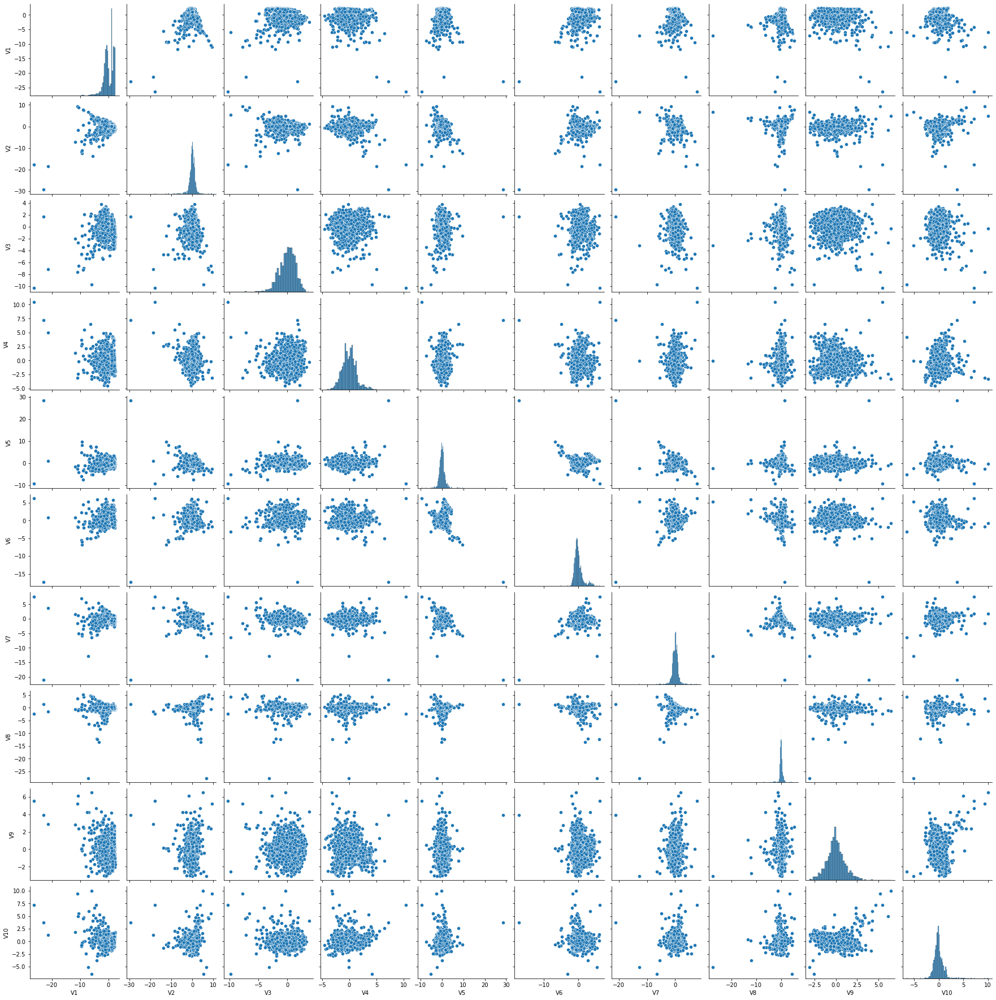

In [15]:
sns.pairplot(legit_f1)

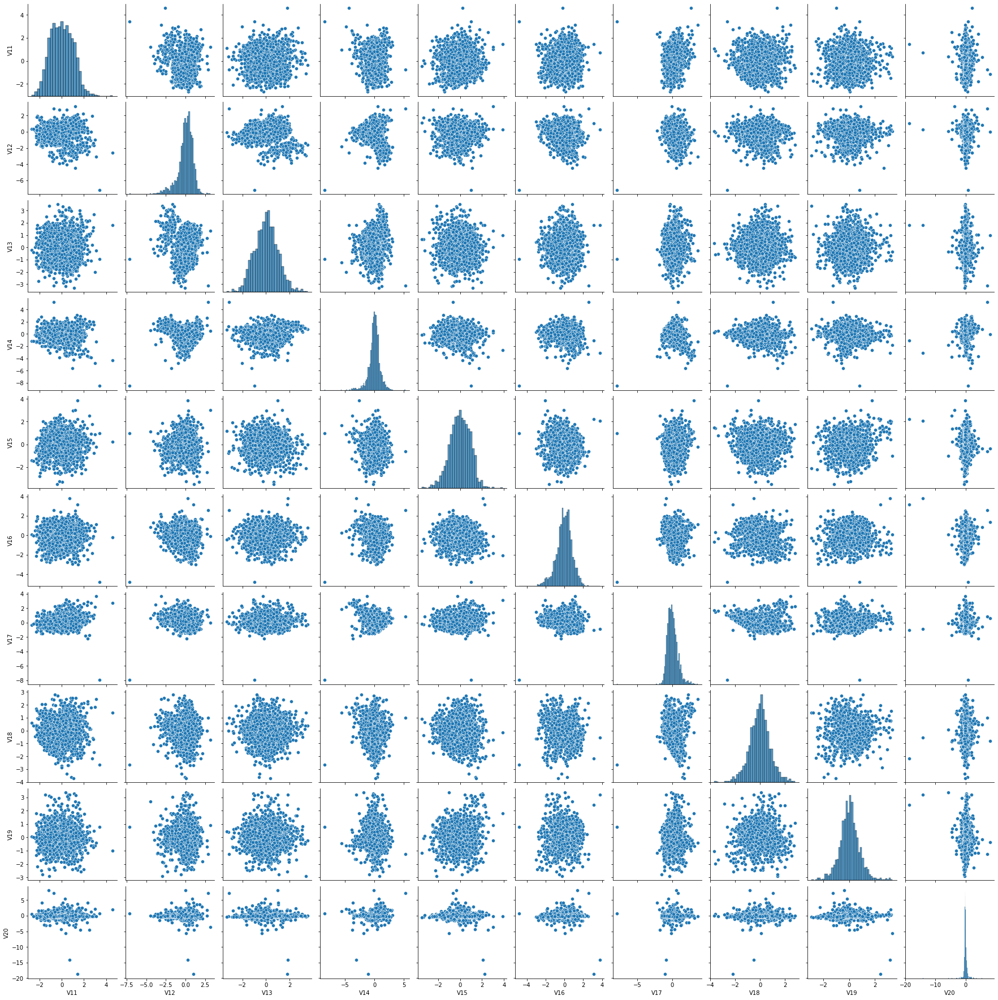

In [16]:
sns.pairplot(legit_f2)

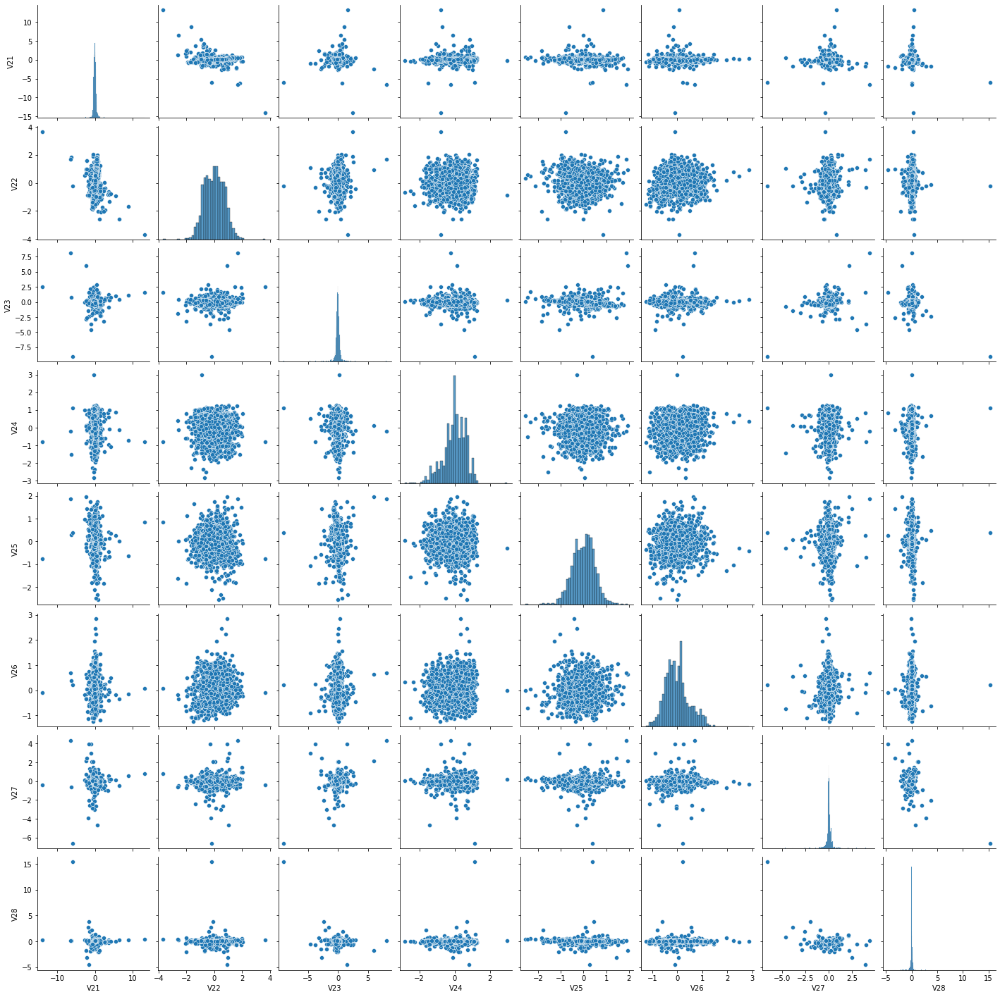

In [17]:
sns.pairplot(legit_f3)

**Fraudulent Transactions**

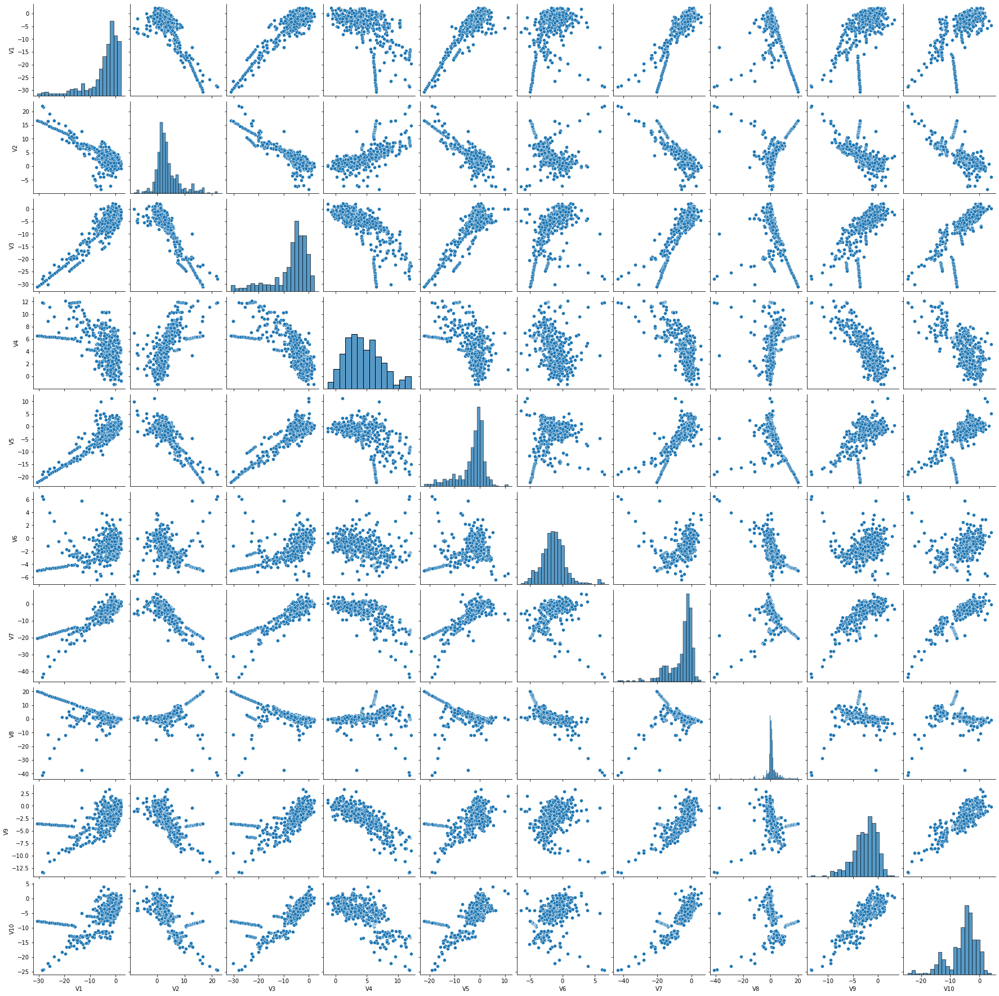

In [18]:
sns.pairplot(fraud_f1)

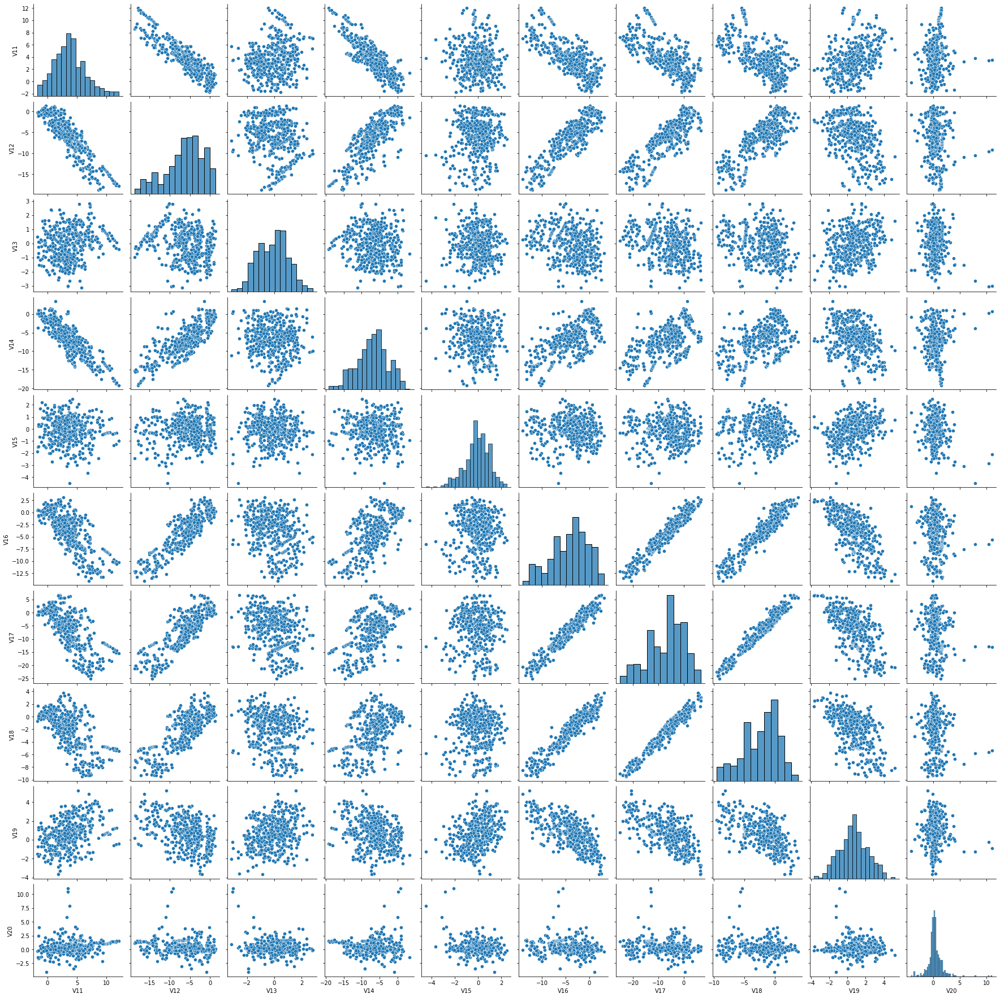

In [19]:
sns.pairplot(fraud_f2)

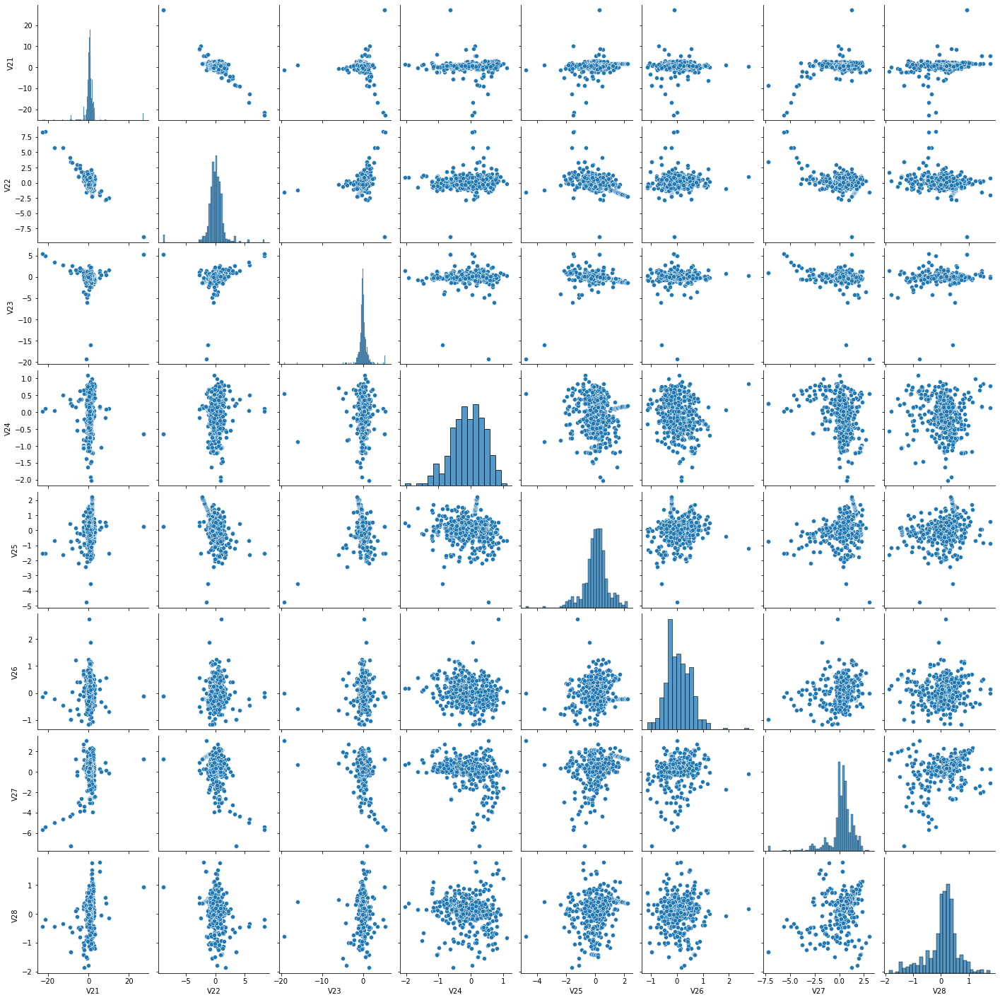

In [20]:
sns.pairplot(fraud_f3)

#### 2.2.3. Correlation Matrix

In [21]:
features_1 = ['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10','Amount','Time']
features_2 = ['V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20','Amount','Time']
features_3 = ['V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28','Amount','Time']

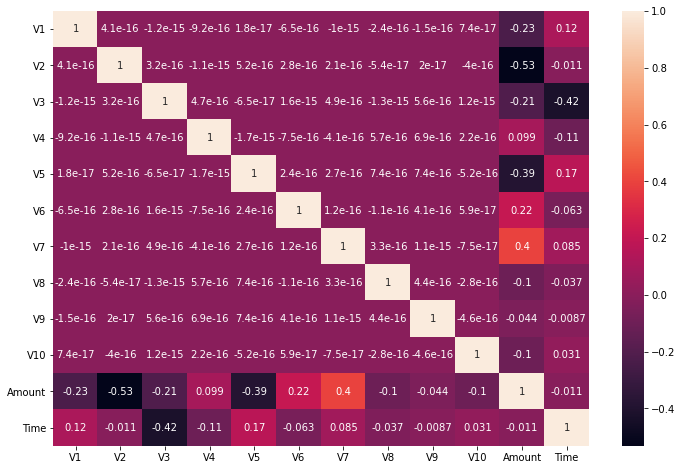

In [22]:
corr_df = df[features_1].corr(method='pearson')

plt.figure(figsize=(12, 8))
sns.heatmap(corr_df, annot=True)
plt.show()

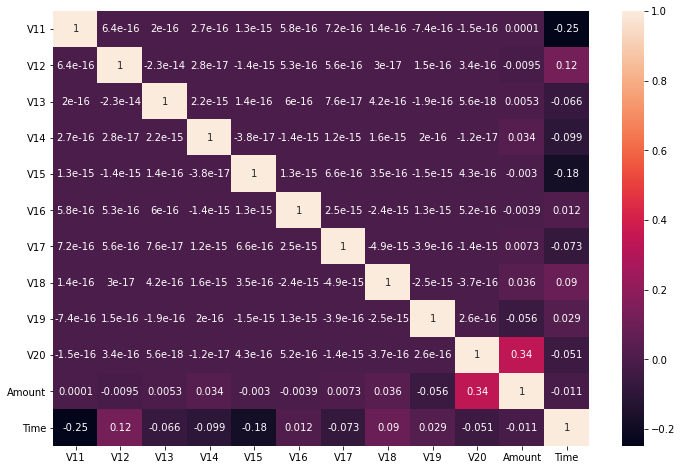

In [23]:
corr_df = df[features_2].corr(method='pearson')

plt.figure(figsize=(12, 8))
sns.heatmap(corr_df, annot=True)
plt.show()

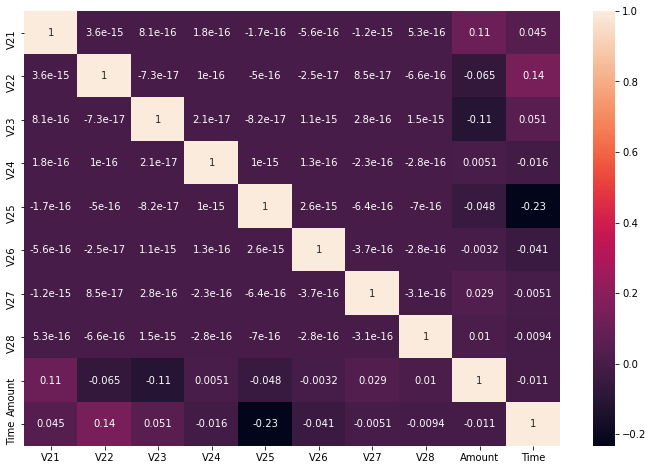

In [24]:
corr_df = df[features_3].corr(method='pearson')

plt.figure(figsize=(12, 8))
sns.heatmap(corr_df, annot=True)
plt.show()

## 3. Data cleanning

### 3.1. Check for null values

In [4]:
df.isnull().sum()

Time      0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64

### 3.2. Check variables types

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

The time variable is saved as a `float64`, but this variable gives the amount of seconds elapsed betweeen transactions and the first transaction of the dataset, it will be changed to `float32` type. As well the class collumn will be changed to a less consuming memory variable `uint8`

In [6]:
df['Time'] = df['Time'].astype('float32')
df['Class'] = df['Class'].astype('uint8')

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float32
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

In [8]:
df.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94812.664062,3.918649e-15,5.682686e-16,-8.761736e-15,2.811118e-15,-1.552103e-15,2.040130e-15,-1.698953e-15,-1.893285e-16,-3.147640e-15,...,1.473120e-16,8.042109e-16,5.282512e-16,4.456271e-15,1.426896e-15,1.701640e-15,-3.662252e-16,-1.217809e-16,88.349619,0.001727
std,47487.195312,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,...,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,...,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,...,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,...,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,...,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,...,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


In [6]:
 np.finfo(np.float64)

finfo(resolution=1e-15, min=-1.7976931348623157e+308, max=1.7976931348623157e+308, dtype=float64)

We managed to save some of the memory, however V1-V28 features need a $10^{-16}$ resolution so we cannot change `float64` to `float32` in order to save more memory

## 4. Data Preprocessing

In [9]:
import sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

In [10]:
input_dat = df.drop(columns='Class',axis=1)
output_dat = df['Class']

In [11]:
input_dat.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99


In [12]:
output_dat.head()

0    0
1    0
2    0
3    0
4    0
Name: Class, dtype: uint8

### 4.1. SMOTE Oversamplig for BaseLine Model

I will implement SMOTE with 2 different approaches. The first one will be apply SMOTE to the complete dataset and then do the exclusion method. The second one will consist on first applying the exclusion method and then SMOTE via pipeline. The goal is to get the aproach that best eliminates data leakage.

In [13]:
from imblearn.over_sampling import SMOTE

# Approach 1
sms = SMOTE(random_state=42, sampling_strategy=0.5)
X_res, y_res = sms.fit_resample(input_dat,output_dat)

X_train_sm_1,X_test_sm_1,y_train_sm_1,y_test_sm_1 = train_test_split(X_res,y_res, test_size=0.2,
                                                             stratify=y_res,random_state=42)
print("X_train Shape : ", X_train_sm_1.shape)
print("X_test Shape  : ", X_test_sm_1.shape)
print("y_train Shape : ", y_train_sm_1.shape)
print("y_test Shape  : ", y_test_sm_1.shape)

X_train Shape :  (341177, 30)
X_test Shape  :  (85295, 30)
y_train Shape :  (341177,)
y_test Shape  :  (85295,)


In [14]:
# Approach 2
X_train_sm_2,X_test_sm_2,y_train_sm_2,y_test_sm_2 = train_test_split(input_dat,output_dat, test_size=0.2,
                                                             stratify=output_dat,random_state=42)
sms = SMOTE(random_state=42, sampling_strategy=0.5)
scaler = StandardScaler()
sm_pipeline = [('SMOTE',sms), ('StandardScaler',scaler)] # Later I  will add the models to this pipeline 

### 4.2. Hybrid: SMOTE & Edited Nearest Neighbor

Simillarly to the SMOTE only method, the two methods will be used. 

In [39]:
from imblearn.under_sampling import EditedNearestNeighbours

# # Approach 1
# sms = SMOTE(random_state=42, sampling_strategy=0.5)
# enn = EditedNearestNeighbours(sampling_strategy='majority',n_jobs=4)

# X_us, y_us = enn.fit_resample(input_dat,output_dat)
# X_res, y_res = sms.fit_resample(X_us,y_us)

# X_train_enn_1,X_test_enn_1,y_train_enn_1,y_test_enn_1 = train_test_split(X_res,y_res, test_size=0.2,
#                                                              stratify=y_res,random_state=42)
# print("X_train Shape : ", X_train_enn.shape)
# print("X_test Shape  : ", X_test_enn.shape)
# print("y_train Shape : ", y_train_enn.shape)
# print("y_test Shape  : ", y_test_enn.shape)

In [40]:
# Approach 2
X_train_enn_2,X_test_enn_2,y_train_enn_2,y_test_enn_2 = train_test_split(input_dat,output_dat, test_size=0.2,
                                                             stratify=output_dat,random_state=42)
sms = SMOTE(random_state=42, sampling_strategy=0.5)
enn = EditedNearestNeighbours(sampling_strategy='majority',n_jobs=4)
scaler = StandardScaler()
enn_pipeline = [('SMOTE',sms),('ENN',enn),('StandardScaler',scaler)] # Later I  will add the models to this pipeline 

## 5. Modelling

I'll compare 5 different algorithms and their according bussines metrics. 

    a. Logistic Regression
    b. Decission Trees
    c. Support Vector Machine
    d. Random Forest
    e. GVCBossting


In [15]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import plot_confusion_matrix
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.metrics import f1_score, recall_score, precision_score, confusion_matrix
from sklearn.metrics import r2_score, roc_auc_score, roc_curve, classification_report
from sklearn.metrics import precision_recall_curve

### 5.1. Baseline

My baseline models will be the simple models with the SMOTE-only oversampled data. 

#### 5.1.1 SMOTE-Logistic Regression

In [17]:
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
# Approach 1 
logi = LogisticRegression(max_iter=10000, tol=0.1)
logi_pipe = Pipeline(steps=[('scaler',scaler),('clf',logi)])
logi_param_grid = {'clf__solver': ['newton-cg', 'lbfgs', 'liblinear'],
                   'clf__C': [0.001,0.01,0.1,1,10,100]}
metrics = ['precision','recall','roc_auc','accuracy']
logi_search = GridSearchCV(logi_pipe, logi_param_grid,cv=5,
                           verbose=3,scoring=metrics,
                           return_train_score=True,n_jobs=-1, refit='roc_auc')
logi_search.fit(X_train_sm_1,y_train_sm_1)

Fitting 5 folds for each of 18 candidates, totalling 90 fits


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('clf',
                                        LogisticRegression(max_iter=10000,
                                                           tol=0.1))]),
             n_jobs=-1,
             param_grid={'clf__C': [0.001, 0.01, 0.1, 1, 10, 100],
                         'clf__solver': ['newton-cg', 'lbfgs', 'liblinear']},
             refit='roc_auc', return_train_score=True,
             scoring=['precision', 'recall', 'roc_auc', 'accuracy'], verbose=3)

In [19]:
# score en el test set
logi_search.score(X_test_sm_1,y_test_sm_1)

0.997434646454647

In [18]:
# Mejores parámetros
logi_search.best_params_

{'clf__C': 100, 'clf__solver': 'newton-cg'}

In [153]:
logi_results_df = pd.DataFrame(logi_search.cv_results_)
logi_results_df.T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
mean_fit_time,9.146424,4.725186,6.723888,12.102382,7.476553,7.171271,16.92961,10.812258,6.995679,20.436501,14.177894,6.870513,23.909501,15.790887,6.703891,21.552358,15.03174,6.590847
std_fit_time,0.493185,0.464686,0.296712,0.328411,0.637417,0.209751,1.339569,0.724068,0.316556,0.965634,1.64252,0.130664,0.804732,1.402854,0.212807,1.005823,1.533537,0.434023
mean_score_time,0.280778,0.282011,0.271461,0.305274,0.283772,0.289566,0.29262,0.289483,0.301867,0.263639,0.284171,0.293669,0.276135,0.265669,0.278546,0.171439,0.247029,0.279867
std_score_time,0.046788,0.013405,0.020563,0.070987,0.015209,0.035913,0.032308,0.035611,0.013215,0.023545,0.01781,0.0446,0.030024,0.02838,0.049211,0.050341,0.025873,0.047922
param_clf__C,0.001,0.001,0.001,0.01,0.01,0.01,0.1,0.1,0.1,1,1,1,10,10,10,100,100,100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
split2_train_accuracy,0.973075,0.973075,0.969188,0.979208,0.979208,0.970202,0.982242,0.982238,0.970382,0.983363,0.983359,0.970382,0.983531,0.983524,0.970386,0.983579,0.983583,0.970386
split3_train_accuracy,0.972961,0.972961,0.969023,0.979208,0.979204,0.970089,0.982421,0.982421,0.970202,0.983579,0.983579,0.970217,0.983788,0.983788,0.970217,0.983817,0.983824,0.970217
split4_train_accuracy,0.972983,0.972983,0.969107,0.978974,0.978974,0.970173,0.982297,0.982297,0.970331,0.983385,0.983377,0.970371,0.983568,0.983572,0.970375,0.983597,0.983597,0.970375
mean_train_accuracy,0.973037,0.973037,0.969082,0.979152,0.979151,0.970138,0.982396,0.982396,0.970276,0.983575,0.983575,0.970292,0.983792,0.983791,0.970295,0.983824,0.983824,0.970295


In [154]:
# Best parameters
top = 5
r = 'rank_test_'
logi_best_df = logi_results_df[ (logi_results_df[r+'roc_auc']<top) & ((logi_results_df[r+'recall']<top)) &
                             ((logi_results_df[r+'precision']<top))]
metrics = ['precision','recall','roc_auc','accuracy']
for metric in metrics:
    logi_best_df = logi_best_df.drop(columns=['split'+str(i)+'_test_'+metric for i in range(5)], axis=1)
    logi_best_df = logi_best_df.drop(columns=['split'+str(i)+'_train_'+metric for i in range(5)], axis=1)
logi_best_df.T

,15,16
mean_fit_time,21.552358,15.03174
std_fit_time,1.005823,1.533537
mean_score_time,0.171439,0.247029
std_score_time,0.050341,0.025873
param_clf__C,100,100
param_clf__solver,newton-cg,lbfgs
params,"{'clf__C': 100, 'clf__solver': 'newton-cg'}","{'clf__C': 100, 'clf__solver': 'lbfgs'}"
mean_test_precision,0.989646,0.989646
std_test_precision,0.00086,0.00086
rank_test_precision,4,3


In [21]:
from imblearn.pipeline import Pipeline as IbPipeline
#Approach 2
logi = LogisticRegression(max_iter=10000, tol=0.1)
sm_pipeline_logi = sm_pipeline.copy()
sm_pipeline_logi.extend([('clf',logi)])
logi_pipe = IbPipeline(steps=sm_pipeline_logi)
logi_param_grid = {'clf__solver': ['newton-cg', 'lbfgs', 'liblinear'],
                   'clf__C': [0.001,0.01,0.1,1,10,100]}
metrics = ['precision','recall','roc_auc','accuracy']
logi_search_2 = GridSearchCV(logi_pipe, logi_param_grid,cv=5,
                           verbose=2,scoring=metrics,
                           return_train_score=True,n_jobs=1, refit='roc_auc')
logi_search_2.fit(X_train_sm_2,y_train_sm_2)

Fitting 5 folds for each of 18 candidates, totalling 90 fits
[CV] END ................clf__C=0.001, clf__solver=newton-cg; total time=   2.0s
[CV] END ................clf__C=0.001, clf__solver=newton-cg; total time=   1.8s
[CV] END ................clf__C=0.001, clf__solver=newton-cg; total time=   1.8s
[CV] END ................clf__C=0.001, clf__solver=newton-cg; total time=   1.9s
[CV] END ................clf__C=0.001, clf__solver=newton-cg; total time=   1.8s
[CV] END ....................clf__C=0.001, clf__solver=lbfgs; total time=   1.0s
[CV] END ....................clf__C=0.001, clf__solver=lbfgs; total time=   0.9s
[CV] END ....................clf__C=0.001, clf__solver=lbfgs; total time=   0.9s
[CV] END ....................clf__C=0.001, clf__solver=lbfgs; total time=   0.9s
[CV] END ....................clf__C=0.001, clf__solver=lbfgs; total time=   1.0s
[CV] END ................clf__C=0.001, clf__solver=liblinear; total time=   0.8s
[CV] END ................clf__C=0.001, clf__solv

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('SMOTE',
                                        SMOTE(random_state=42,
                                              sampling_strategy=0.5)),
                                       ('StandardScaler', StandardScaler()),
                                       ('clf',
                                        LogisticRegression(max_iter=10000,
                                                           tol=0.1))]),
             n_jobs=1,
             param_grid={'clf__C': [0.001, 0.01, 0.1, 1, 10, 100],
                         'clf__solver': ['newton-cg', 'lbfgs', 'liblinear']},
             refit='roc_auc', return_train_score=True,
             scoring=['precision', 'recall', 'roc_auc', 'accuracy'], verbose=2)

In [159]:
# score en el test set
logi_search_2.score(X_test_sm_2,y_test_sm_2)

0.9770422519035752

In [146]:
# Mejores parámetros
logi_search_2.best_params_

{'clf__C': 0.01, 'clf__solver': 'newton-cg'}

In [147]:
logi_results_df_2 = pd.DataFrame(logi_search_2.cv_results_)
logi_results_df_2.T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
mean_fit_time,12.419477,5.957578,5.188778,14.850481,8.33315,4.699536,18.513275,12.857912,4.50354,24.658759,19.533116,4.42371,26.177206,21.69779,4.555042,24.108072,18.882043,4.230174
std_fit_time,0.566021,0.328846,0.305313,0.901563,0.37747,0.290697,1.434997,0.808279,0.165051,2.955337,3.411265,0.357793,2.063217,4.605214,0.231827,1.629112,3.78999,0.289618
mean_score_time,0.220871,0.211267,0.236201,0.213982,0.230384,0.19964,0.226299,0.236551,0.224195,0.217324,0.210899,0.201948,0.220463,0.208594,0.229038,0.120627,0.149681,0.20795
std_score_time,0.02155,0.021201,0.028253,0.013552,0.030238,0.020034,0.012322,0.055729,0.023309,0.013016,0.0357,0.014315,0.017346,0.011295,0.021854,0.045409,0.04754,0.024368
param_clf__C,0.001,0.001,0.001,0.01,0.01,0.01,0.1,0.1,0.1,1,1,1,10,10,10,100,100,100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
split2_train_accuracy,0.99554,0.99554,0.994925,0.994399,0.994399,0.99346,0.994706,0.994706,0.993285,0.99487,0.99487,0.993285,0.994903,0.994903,0.993285,0.994914,0.994909,0.993285
split3_train_accuracy,0.995666,0.995666,0.994464,0.993823,0.993823,0.993038,0.994349,0.994349,0.992868,0.994519,0.994519,0.992846,0.994552,0.994552,0.992846,0.994558,0.994558,0.992846
split4_train_accuracy,0.994547,0.994547,0.994058,0.993844,0.993844,0.992934,0.994102,0.994102,0.992764,0.99436,0.99436,0.992753,0.994333,0.994333,0.992753,0.994344,0.994344,0.992753
mean_train_accuracy,0.995294,0.995294,0.994456,0.994039,0.994039,0.993053,0.994378,0.99438,0.992882,0.994564,0.994565,0.992981,0.994592,0.99459,0.992981,0.994596,0.994595,0.99298


In [149]:
# Best parameters
top = 18
r = 'rank_test_'

logi_best_df_2 = logi_results_df_2[ (logi_results_df_2[r+'roc_auc']<top) & ((logi_results_df_2[r+'recall']<top)) &
                             ((logi_results_df_2[r+'precision']<top))]
metrics = ['precision','recall','roc_auc','accuracy']
for metric in metrics:
    logi_best_df_2 = logi_best_df_2.drop(columns=['split'+str(i)+'_test_'+metric for i in range(5)], axis=1)
    logi_best_df_2 = logi_best_df_2.drop(columns=['split'+str(i)+'_train_'+metric for i in range(5)], axis=1)
logi_best_df_2.T

,0,1,3,4,5,6,7,9,10,11,12,13,14,15,17
mean_fit_time,12.419477,5.957578,14.850481,8.33315,4.699536,18.513275,12.857912,24.658759,19.533116,4.42371,26.177206,21.69779,4.555042,24.108072,4.230174
std_fit_time,0.566021,0.328846,0.901563,0.37747,0.290697,1.434997,0.808279,2.955337,3.411265,0.357793,2.063217,4.605214,0.231827,1.629112,0.289618
mean_score_time,0.220871,0.211267,0.213982,0.230384,0.19964,0.226299,0.236551,0.217324,0.210899,0.201948,0.220463,0.208594,0.229038,0.120627,0.20795
std_score_time,0.02155,0.021201,0.013552,0.030238,0.020034,0.012322,0.055729,0.013016,0.0357,0.014315,0.017346,0.011295,0.021854,0.045409,0.024368
param_clf__C,0.001,0.001,0.01,0.01,0.01,0.1,0.1,1,1,1,10,10,10,100,100
param_clf__solver,newton-cg,lbfgs,newton-cg,lbfgs,liblinear,newton-cg,lbfgs,newton-cg,lbfgs,liblinear,newton-cg,lbfgs,liblinear,newton-cg,liblinear
params,"{'clf__C': 0.001, 'clf__solver': 'newton-cg'}","{'clf__C': 0.001, 'clf__solver': 'lbfgs'}","{'clf__C': 0.01, 'clf__solver': 'newton-cg'}","{'clf__C': 0.01, 'clf__solver': 'lbfgs'}","{'clf__C': 0.01, 'clf__solver': 'liblinear'}","{'clf__C': 0.1, 'clf__solver': 'newton-cg'}","{'clf__C': 0.1, 'clf__solver': 'lbfgs'}","{'clf__C': 1, 'clf__solver': 'newton-cg'}","{'clf__C': 1, 'clf__solver': 'lbfgs'}","{'clf__C': 1, 'clf__solver': 'liblinear'}","{'clf__C': 10, 'clf__solver': 'newton-cg'}","{'clf__C': 10, 'clf__solver': 'lbfgs'}","{'clf__C': 10, 'clf__solver': 'liblinear'}","{'clf__C': 100, 'clf__solver': 'newton-cg'}","{'clf__C': 100, 'clf__solver': 'liblinear'}"
mean_test_precision,0.250419,0.250419,0.210072,0.210072,0.182888,0.219373,0.219373,0.223401,0.223401,0.179947,0.225629,0.225505,0.179947,0.225831,0.179947
std_test_precision,0.024166,0.024166,0.012266,0.012266,0.009023,0.013783,0.013783,0.015085,0.015085,0.008826,0.015577,0.015735,0.008826,0.015946,0.008826
rank_test_precision,1,1,12,12,14,10,10,7,7,15,5,6,15,4,15


In [33]:
def best_results(search_df, top=5):
    best_df = search_df.copy()
    r = 'rank_test_'
    
    best_df = best_df[ (best_df[r+'roc_auc']<top) & ((best_df[r+'recall']<top)) &
                                 ((best_df[r+'precision']<top))]
    metrics = ['precision','recall','roc_auc','accuracy']
    for metric in metrics:
        best_df = best_df.drop(columns=['split'+str(i)+'_test_'+metric for i in range(5)], axis=1)
        best_df = best_df.drop(columns=['split'+str(i)+'_train_'+metric for i in range(5)], axis=1)
    return best_df.T
    

#### 5.1.2 SMOTE-Decision Tree

In [160]:
from sklearn.tree import DecisionTreeClassifier
# Approach 1 
tree = DecisionTreeClassifier(random_state=42)
tree_pipe = Pipeline(steps=[('scaler',scaler),('clf',tree)])
tree_param_grid = {'clf__criterion': ['gini','entropy'],
                   'clf__splitter': ['best','random'], 'clf__max_depth': [i+1 for i in range(7)],
                  'clf__max_features':['auto','sqrt','log2']}
metrics = ['precision','recall','roc_auc','accuracy']
tree_search = GridSearchCV(tree_pipe, tree_param_grid,cv=5,
                           verbose=1,scoring=metrics,
                           return_train_score=True,n_jobs=-1, refit='roc_auc')
tree_search.fit(X_train_sm_1,y_train_sm_1)

Fitting 5 folds for each of 84 candidates, totalling 420 fits


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('clf',
                                        DecisionTreeClassifier(random_state=42))]),
             n_jobs=-1,
             param_grid={'clf__criterion': ['gini', 'entropy'],
                         'clf__max_depth': [1, 2, 3, 4, 5, 6, 7],
                         'clf__max_features': ['auto', 'sqrt', 'log2'],
                         'clf__splitter': ['best', 'random']},
             refit='roc_auc', return_train_score=True,
             scoring=['precision', 'recall', 'roc_auc', 'accuracy'], verbose=1)

In [161]:
# score en el test set
tree_search.score(X_test_sm_1,y_test_sm_1)

0.9903185457912937

In [162]:
# Mejores parámetros
tree_search.best_params_

{'clf__criterion': 'entropy',
 'clf__max_depth': 7,
 'clf__max_features': 'auto',
 'clf__splitter': 'best'}

In [163]:
tree_results_df = pd.DataFrame(tree_search.cv_results_)
tree_results_df.T

,0,1,2,3,4,5,6,7,8,9,...,74,75,76,77,78,79,80,81,82,83
mean_fit_time,1.800804,1.253681,2.008352,1.407067,1.759314,1.484042,2.756933,1.205426,2.362224,1.29654,...,4.461879,0.928412,3.971953,1.045529,4.579625,1.059543,4.851394,1.062794,4.016106,0.902434
std_fit_time,0.247374,0.162784,0.443216,0.141308,0.204187,0.27103,0.126073,0.229715,0.162427,0.131774,...,0.407479,0.100598,0.290565,0.152959,0.545324,0.044134,0.173739,0.206769,0.231624,0.069588
mean_score_time,0.420258,0.30907,0.326651,0.355779,0.329744,0.33219,0.401634,0.292888,0.341081,0.317074,...,0.23355,0.217448,0.208067,0.241491,0.198236,0.230252,0.208447,0.249303,0.166838,0.204051
std_score_time,0.167478,0.076109,0.070418,0.0826,0.093972,0.043691,0.124835,0.055931,0.084202,0.061743,...,0.027515,0.014308,0.014504,0.040505,0.028454,0.022288,0.014405,0.056632,0.018566,0.020532
param_clf__criterion,gini,gini,gini,gini,gini,gini,gini,gini,gini,gini,...,entropy,entropy,entropy,entropy,entropy,entropy,entropy,entropy,entropy,entropy
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
split2_train_accuracy,0.759081,0.701336,0.759081,0.701336,0.759081,0.701336,0.906346,0.727345,0.906346,0.727345,...,0.969503,0.7726,0.94637,0.881433,0.962747,0.848257,0.962747,0.848257,0.96552,0.896172
split3_train_accuracy,0.75966,0.735761,0.75966,0.735761,0.75966,0.735761,0.905749,0.738388,0.905749,0.738388,...,0.9667,0.838057,0.943189,0.890032,0.973833,0.864942,0.973833,0.864942,0.961702,0.874336
split4_train_accuracy,0.759641,0.735545,0.759641,0.735545,0.759641,0.735545,0.906244,0.738226,0.906244,0.738226,...,0.969719,0.824153,0.944402,0.889625,0.962824,0.877853,0.962824,0.877853,0.962637,0.779001
mean_train_accuracy,0.759505,0.728634,0.759505,0.728634,0.759505,0.728634,0.906071,0.736009,0.906071,0.736009,...,0.967736,0.829256,0.944579,0.888611,0.967069,0.880605,0.967069,0.880605,0.963621,0.850422


In [168]:
best_results(tree_results_df,top=20)

,30,32,78,80
mean_fit_time,3.967479,3.915067,4.579625,4.851394
std_fit_time,0.326175,0.190226,0.545324,0.173739
mean_score_time,0.21655,0.269881,0.198236,0.208447
std_score_time,0.023504,0.064974,0.028454,0.014405
param_clf__criterion,gini,gini,entropy,entropy
param_clf__max_depth,6,6,7,7
param_clf__max_features,auto,sqrt,auto,sqrt
param_clf__splitter,best,best,best,best
params,"{'clf__criterion': 'gini', 'clf__max_depth': 6...","{'clf__criterion': 'gini', 'clf__max_depth': 6...","{'clf__criterion': 'entropy', 'clf__max_depth'...","{'clf__criterion': 'entropy', 'clf__max_depth'..."
mean_test_precision,0.981863,0.981863,0.984873,0.984873


In [170]:
#Approach 2


tree = DecisionTreeClassifier(random_state=42)
sm_pipeline_tree = sm_pipeline.copy()
sm_pipeline_tree.extend([('clf',tree)])
tree_pipe = IbPipeline(steps=sm_pipeline_tree)
tree_param_grid = {'clf__criterion': ['gini','entropy'],
                   'clf__splitter': ['best','random'], 'clf__max_depth': [i+1 for i in range(7)],
                  'clf__max_features':['auto','sqrt','log2']}
metrics = ['precision','recall','roc_auc','accuracy']
tree_search_2 = GridSearchCV(tree_pipe, tree_param_grid,cv=5,
                           verbose=1,scoring=metrics,
                           return_train_score=True,n_jobs=-1, refit='roc_auc')
tree_search_2.fit(X_train_sm_2,y_train_sm_2)

Fitting 5 folds for each of 84 candidates, totalling 420 fits


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('SMOTE',
                                        SMOTE(random_state=42,
                                              sampling_strategy=0.5)),
                                       ('StandardScaler', StandardScaler()),
                                       ('clf',
                                        DecisionTreeClassifier(random_state=42))]),
             n_jobs=-1,
             param_grid={'clf__criterion': ['gini', 'entropy'],
                         'clf__max_depth': [1, 2, 3, 4, 5, 6, 7],
                         'clf__max_features': ['auto', 'sqrt', 'log2'],
                         'clf__splitter': ['best', 'random']},
             refit='roc_auc', return_train_score=True,
             scoring=['precision', 'recall', 'roc_auc', 'accuracy'], verbose=1)

In [171]:
# score en el test set
tree_search_2.score(X_test_sm_1,y_test_sm_1)

0.9744472244873998

In [172]:
# Mejores parámetros
tree_search_2.best_params_

{'clf__criterion': 'entropy',
 'clf__max_depth': 4,
 'clf__max_features': 'auto',
 'clf__splitter': 'best'}

In [173]:
tree_results_df_2 = pd.DataFrame(tree_search_2.cv_results_)
tree_results_df_2.T

,0,1,2,3,4,5,6,7,8,9,...,74,75,76,77,78,79,80,81,82,83
mean_fit_time,3.230632,2.621495,2.957298,2.407672,2.963759,2.472292,3.652225,2.363009,3.507904,2.369959,...,5.356641,1.807385,4.830071,1.751692,5.623901,2.019335,5.082618,1.845888,4.462717,1.605246
std_fit_time,0.349467,0.314501,0.190037,0.119331,0.244892,0.200238,0.290647,0.32016,0.125221,0.197283,...,0.287619,0.214254,0.189561,0.205505,0.23475,0.244013,0.259956,0.174129,0.265046,0.196887
mean_score_time,0.22425,0.197445,0.226153,0.236748,0.26102,0.238605,0.218057,0.233653,0.194376,0.193687,...,0.181149,0.178839,0.169845,0.160565,0.139831,0.159034,0.159078,0.18509,0.075617,0.125028
std_score_time,0.023655,0.037781,0.030651,0.029551,0.097324,0.029513,0.042442,0.030759,0.010382,0.030911,...,0.022329,0.067405,0.012165,0.017276,0.011516,0.02881,0.01701,0.032779,0.013324,0.015508
param_clf__criterion,gini,gini,gini,gini,gini,gini,gini,gini,gini,gini,...,entropy,entropy,entropy,entropy,entropy,entropy,entropy,entropy,entropy,entropy
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
split2_train_accuracy,0.920083,0.998261,0.920083,0.998261,0.920083,0.998261,0.976393,0.998266,0.976393,0.998266,...,0.992484,0.936711,0.990229,0.997959,0.983766,0.997877,0.983766,0.997877,0.987662,0.995359
split3_train_accuracy,0.919699,0.998113,0.919699,0.998113,0.919699,0.998113,0.977123,0.998118,0.977123,0.998118,...,0.989927,0.969782,0.99351,0.964499,0.986345,0.966249,0.986345,0.966249,0.990476,0.957279
split4_train_accuracy,0.919232,0.998266,0.919232,0.998266,0.919232,0.998266,0.981374,0.998436,0.981374,0.998436,...,0.991815,0.984244,0.986416,0.98155,0.992605,0.99769,0.992605,0.99769,0.987667,0.911738
mean_train_accuracy,0.922174,0.996645,0.922174,0.996645,0.922174,0.996645,0.977927,0.996509,0.977927,0.996509,...,0.987791,0.959237,0.986167,0.988136,0.987343,0.981176,0.987343,0.981176,0.987016,0.967724


In [181]:
best_results(tree_results_df_2,top=35)

,54,56
mean_fit_time,4.21308,3.911884
std_fit_time,0.378795,0.264318
mean_score_time,0.190066,0.214064
std_score_time,0.028077,0.012669
param_clf__criterion,entropy,entropy
param_clf__max_depth,3,3
param_clf__max_features,auto,sqrt
param_clf__splitter,best,best
params,"{'clf__criterion': 'entropy', 'clf__max_depth'...","{'clf__criterion': 'entropy', 'clf__max_depth'..."
mean_test_precision,0.247272,0.247272


#### 5.1.3 SMOTE-Support Vector Machine

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
# Approach 1 
svc = SVC(random_state=42)
svc_pipe = Pipeline(steps=[('scaler',scaler),('clf',svc)])
# svc_param_grid = [{"clf__kernel":["rbf"],
#                "clf__C": [0.001,0.01,0.1,1,10,100],
#                "clf__gamma": [0.001,0.01,0.1,1,10,100]},
#               {"clf__kernel": ["linear"],
#                "clf__C": [0.001,0.01,0.1,1,10,100]}]
svc_param_grid = {'clf__kernel': ['linear','poly','rbf','sigmoid','precomputed'],
                   "clf__C": [0.01,0.1,1,10], "clf__gamma": [0.01,0.1,1,10]}
metrics = ['precision','recall','roc_auc','accuracy']
svc_search = GridSearchCV(svc_pipe, svc_param_grid,cv=5,
                           verbose=2,scoring=metrics,
                           return_train_score=True,n_jobs=1, refit='roc_auc')
svc_search.fit(X_train_sm_1,y_train_sm_1)

Fitting 5 folds for each of 80 candidates, totalling 400 fits


In [23]:
def print_best(search):
    # score en el test set
    print('Score:',search.score(X_test_sm_1,y_test_sm_1))
    # Mejores parámetros
    print('Best params',search.best_params_)
    return
def result_df(search):
    df = pd.DataFrame(search.cv_results_)
    return df.T

In [ ]:
print_best(svc_search)

In [ ]:
result_df(svc_search)

In [ ]:
best_results(result_df(svc_search),top=20)

In [ ]:
#Approach 2
svc = SVC(random_state=42)
sm_pipeline_svc = sm_pipeline.copy()
sm_pipeline_svc.extend([('clf',svc)])
svc_pipe = IbPipeline(steps=sm_pipeline_svc)
svc_param_grid = {'clf__kernel': ['linear','poly','rbf','sigmoid','precomputed'],
                   "clf__C": [0.001,0.01,0.1,1,10,100], "clf__gamma": [0.001,0.01,0.1,1,10,100]}
metrics = ['precision','recall','roc_auc','accuracy']
svc_search_2 = GridSearchCV(svc_pipe, svc_param_grid,cv=5,
                           verbose=1,scoring=metrics,
                           return_train_score=True,n_jobs=-1, refit='roc_auc')
svc_search_2.fit(X_train_sm_2,y_train_sm_2)

### 5.2. Complex Models
My complex models will involve Random Forest and Gradient Boost, on the other hand hybrid under/oversampling technique: SMOTE/ENN will remain on hiatus due to lack of computational brute force. 

#### 5.2.1 SMOTE-Random Forest

In [22]:
from sklearn.ensemble import RandomForestClassifier
# Approach 1 
rf = RandomForestClassifier(random_state=42, n_jobs=-1)
rf_pipe = Pipeline(steps=[('scaler',scaler),('clf',rf)])
rf_param_grid = {'clf__criterion': ['gini','entropy'],
                   'clf__n_estimators': [50,100,500,1000], 'clf__max_depth': [i+1 for i in range(4)]}
metrics = ['precision','recall','roc_auc','accuracy']
rf_search = GridSearchCV(rf_pipe, rf_param_grid,cv=8,
                           verbose=2,scoring=metrics,
                           return_train_score=True,n_jobs=-1, refit='roc_auc')
rf_search.fit(X_train_sm_1,y_train_sm_1)

Fitting 8 folds for each of 32 candidates, totalling 256 fits


GridSearchCV(cv=8,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('clf',
                                        RandomForestClassifier(n_jobs=-1,
                                                               random_state=42))]),
             n_jobs=-1,
             param_grid={'clf__criterion': ['gini', 'entropy'],
                         'clf__max_depth': [1, 2, 3, 4],
                         'clf__n_estimators': [50, 100, 500, 1000]},
             refit='roc_auc', return_train_score=True,
             scoring=['precision', 'recall', 'roc_auc', 'accuracy'], verbose=2)

In [24]:
print_best(rf_search)

Score: 0.9942326573834013
Best params {'clf__criterion': 'entropy', 'clf__max_depth': 4, 'clf__n_estimators': 1000}


In [37]:
result_df(rf_search)

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
mean_fit_time,18.859109,25.844179,138.325437,262.596849,43.699439,55.779527,268.011814,459.723119,58.332475,83.186182,...,338.232081,567.39449,69.050382,95.910916,443.145021,810.059685,84.73266,134.327792,583.013928,851.560243
std_fit_time,4.259683,3.385843,2.691344,4.776128,2.147176,13.321537,3.502984,32.387473,1.867553,4.484264,...,2.836271,23.639902,1.353384,2.045956,1.163106,20.073474,0.577531,10.248528,2.374292,122.507694
mean_score_time,5.738414,11.528214,12.498557,13.382505,17.473924,12.211117,20.354571,19.317588,17.076335,16.381929,...,15.051506,23.998389,21.51724,18.143073,23.451517,20.755036,21.412434,22.003566,21.536587,8.227847
std_score_time,3.912867,9.121024,1.437853,0.754634,2.514057,1.224606,3.610171,5.711526,5.096873,5.76531,...,2.506266,2.203425,0.436216,3.508738,0.281662,5.553895,0.47236,1.053771,3.031006,5.06036
param_clf__criterion,gini,gini,gini,gini,gini,gini,gini,gini,gini,gini,...,entropy,entropy,entropy,entropy,entropy,entropy,entropy,entropy,entropy,entropy
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
split5_train_accuracy,0.958694,0.949556,0.948317,0.947389,0.963099,0.95988,0.960175,0.960252,0.968234,0.966141,...,0.959391,0.959498,0.967089,0.965642,0.966,0.965498,0.970348,0.969842,0.970067,0.969809
split6_train_accuracy,0.958842,0.94964,0.948725,0.947754,0.963247,0.960068,0.960386,0.960356,0.968559,0.966379,...,0.959636,0.959733,0.96738,0.965699,0.966097,0.965555,0.970753,0.970268,0.970224,0.969822
split7_train_accuracy,0.958942,0.950039,0.948836,0.947851,0.963213,0.960228,0.960423,0.960419,0.968442,0.966402,...,0.959719,0.95981,0.967792,0.965906,0.966144,0.965658,0.970676,0.970037,0.970177,0.969849
mean_train_accuracy,0.958974,0.949863,0.948554,0.947603,0.963177,0.960106,0.960309,0.960329,0.96848,0.966326,...,0.959606,0.959711,0.967449,0.965732,0.966023,0.965534,0.970469,0.969993,0.970094,0.969831


In [40]:
best_results(result_df(rf_search).T,top=18)

,9,13,25,26,27,29
mean_fit_time,83.186182,114.570105,95.910916,443.145021,810.059685,134.327792
std_fit_time,4.484264,4.947209,2.045956,1.163106,20.073474,10.248528
mean_score_time,16.381929,19.110166,18.143073,23.451517,20.755036,22.003566
std_score_time,5.76531,3.358156,3.508738,0.281662,5.553895,1.053771
param_clf__criterion,gini,gini,entropy,entropy,entropy,entropy
param_clf__max_depth,3,4,3,3,3,4
param_clf__n_estimators,100,100,100,500,1000,100
params,"{'clf__criterion': 'gini', 'clf__max_depth': 3...","{'clf__criterion': 'gini', 'clf__max_depth': 4...","{'clf__criterion': 'entropy', 'clf__max_depth'...","{'clf__criterion': 'entropy', 'clf__max_depth'...","{'clf__criterion': 'entropy', 'clf__max_depth'...","{'clf__criterion': 'entropy', 'clf__max_depth'..."
split5_test_precision,0.99767,0.997929,0.997975,0.997434,0.997584,0.997924
split6_test_precision,0.998051,0.998232,0.998046,0.997894,0.997967,0.998076


In [ ]:
# Approach 2
rf = RandomForestClassifier(random_state=42, n_jobs=-1)
sm_pipeline_rf = sm_pipeline.copy()
sm_pipeline_rf.extend([('clf',rf)])
rf_pipe = IbPipeline(steps=sm_pipeline_rf)
rf_param_grid = {'clf__criterion': ['gini','entropy'],
                   'clf__n_estimators': [50,100,500,1000], 'clf__max_depth': [i+1 for i in range(4)]}
metrics = ['precision','recall','roc_auc','accuracy']
rf_search_2 = GridSearchCV(rf_pipe, rf_param_grid,cv=8,
                           verbose=1,scoring=metrics,
                           return_train_score=True,n_jobs=-1, refit='roc_auc')
rf_search_2.fit(X_train_sm_2,y_train_sm_2)

#### 5.2.2 SMOTE/-GradientBoost

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
# Approach 1 
gb = GradientBoostingClassifier(random_state=42)
gb_pipe = Pipeline(steps=[('scaler',scaler),('clf',gb)])
gb_param_grid = {'clf__loss': ['deviance','exponential'],
                   'clf__n_estimators': [50,100,500,1000], 'clf__learning_rate': [0.001,0.01,0.1,1]}
metrics = ['precision','recall','roc_auc','accuracy']
gb_search = GridSearchCV(gb_pipe, gb_param_grid,cv=8,
                           verbose=1,scoring=metrics,
                           return_train_score=True,n_jobs=-1, refit='roc_auc')
gb_search.fit(X_train_sm_1,y_train_sm_1)

In [ ]:
# Approach 2
gb = GradientBoostingClassifier(random_state=42)
sm_pipeline_gb = sm_pipeline.copy()
sm_pipeline_gb.extend([('clf',gb)])
gb_pipe = IbPipeline(steps=sm_pipeline_gb)
gb_param_grid = {'clf__loss': ['deviance','exponential'],
                   'clf__n_estimators': [50,100,500,1000], 'clf__learning_rate': [0.001,0.01,0.1,1]}
metrics = ['precision','recall','roc_auc','accuracy']
gb_search_2 = GridSearchCV(gb_pipe, gb_param_grid,cv=8,
                           verbose=1,scoring=metrics,
                           return_train_score=True,n_jobs=-1, refit='roc_auc')
gb_search_2.fit(X_train_sm_2,y_train_sm_2)

### 5.2. Complex Models
My complex models will involve the previous algorithms but the ensambled ones as well while using hybrid under/oversampling technique: SMOTE/ENN

#### 5.2.1 SMOTE/ENN-Logistic Regression

#### 5.2.2 SMOTE/ENN-Decission Tree

#### 5.2.3 SMOTE/ENN-Support Vector Machine

#### 5.2.4 SMOTE/ENN-Random Forest

#### 5.2.5 SMOTE/ENN-GVCBoosting

### 5.3 Model Selection - Model Tunning

#### 5.3.1. Cross Validation Summary

#### 5.3.2. Model Tunning

## 6. Discussion of Results

### 6.1. Best Model Selection

### 6.2 SHAP 

## 7. Conclusion and Executive Report